# Clustering

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

import os
os.environ["OMP_NUM_THREADS"] = "4"

from sklearn.metrics import *
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph

In [34]:
#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler

#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform

# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [35]:
df = pd.read_csv("train_cleaned.csv")

In [36]:
df = df.replace({"explicit": {False:0, True:1}})

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              15000 non-null  object 
 1   duration_ms       15000 non-null  int64  
 2   explicit          15000 non-null  int64  
 3   popularity        15000 non-null  int64  
 4   artists           15000 non-null  object 
 5   album_name        15000 non-null  object 
 6   danceability      15000 non-null  float64
 7   energy            15000 non-null  float64
 8   key               15000 non-null  int64  
 9   loudness          15000 non-null  float64
 10  speechiness       15000 non-null  float64
 11  acousticness      15000 non-null  float64
 12  instrumentalness  15000 non-null  float64
 13  liveness          15000 non-null  float64
 14  valence           15000 non-null  float64
 15  tempo             15000 non-null  float64
 16  time_signature    15000 non-null  float6

In [38]:
nostrings = df.drop(columns = ['name','explicit','artists','album_name','genre'])

In [39]:
nostrings

,duration_ms,popularity,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,241760,46,0.690,0.513,5,-12.529,0.0975,0.302000,0.536000,0.2810,0.6350,142.221,4.0
1,444000,0,0.069,0.196,1,-24.801,0.0805,0.283000,0.934000,0.3600,0.0336,75.596,4.0
2,333506,3,0.363,0.854,2,-7.445,0.0397,0.000089,0.800000,0.2620,0.4890,116.628,4.0
3,269800,23,0.523,0.585,5,-5.607,0.0765,0.066400,0.001270,0.1170,0.3850,140.880,4.0
4,307651,25,0.643,0.687,7,-11.340,0.0539,0.000576,0.096900,0.2990,0.6370,143.956,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,432026,0,0.554,0.657,1,-14.232,0.0558,0.016000,0.615000,0.1320,0.0335,117.319,4.0
14996,182746,44,0.103,0.860,1,-19.627,0.0595,0.548000,0.940000,0.1230,0.0016,92.323,3.0
14997,400091,43,0.799,0.535,1,-9.103,0.0594,0.001830,0.857000,0.0713,0.0708,126.000,4.0
14998,197250,37,0.511,0.970,5,-2.299,0.0531,0.000337,0.000014,0.4020,0.2700,160.044,4.0


In [40]:
X = nostrings.values

In [41]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(X)

In [42]:
kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100, random_state=94)
kmeans.fit(X_minmax)

KMeans(max_iter=100, n_clusters=3, n_init=10, random_state=94)

In [43]:
df["kmeans.labels_"] = kmeans.labels_

In [44]:
df

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre,kmeans.labels_
0,Long Road,241760,0,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,0.0975,0.302000,0.536000,0.2810,0.6350,142.221,4.0,j-dance,1
1,"Daniâl My Son, Where Did You Vanish?",444000,0,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0805,0.283000,0.934000,0.3600,0.0336,75.596,4.0,iranian,2
2,Ondskapens Galakse,333506,0,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,0.0397,0.000089,0.800000,0.2620,0.4890,116.628,4.0,black-metal,1
3,Can't Look Away,269800,0,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,0.0765,0.066400,0.001270,0.1170,0.3850,140.880,4.0,bluegrass,0
4,Thunderground,307651,0,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,0.0539,0.000576,0.096900,0.2990,0.6370,143.956,4.0,happy,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,Outpt,432026,0,0,Autechre,EP7,0.554,0.657,1,-14.232,0.0558,0.016000,0.615000,0.1320,0.0335,117.319,4.0,idm,1
14996,Natural Environment Sounds: To Improve Sleep a...,182746,0,44,Natural White Noise Relaxation,Baby Sleep White Noise: Ultimate Album to Help...,0.103,0.860,1,-19.627,0.0595,0.548000,0.940000,0.1230,0.0016,92.323,3.0,sleep,2
14997,Psychological Attack,400091,0,43,Droplex,Psychological Attack,0.799,0.535,1,-9.103,0.0594,0.001830,0.857000,0.0713,0.0708,126.000,4.0,techno,1
14998,Don't Hate The 808 (feat. Lafa Taylor),197250,0,37,Bassnectar;Lafa Taylor,Noise vs Beauty,0.511,0.970,5,-2.299,0.0531,0.000337,0.000014,0.4020,0.2700,160.044,4.0,breakbeat,0


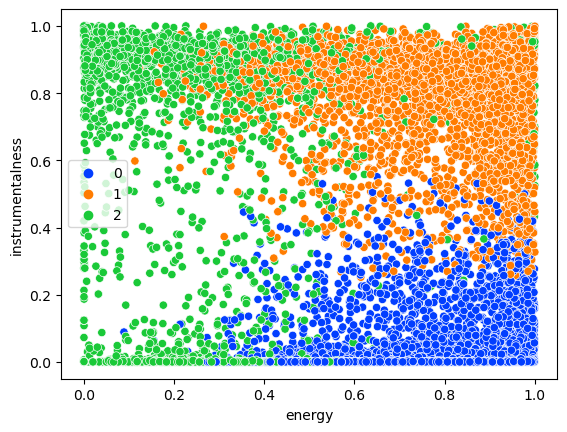

In [45]:
sns.scatterplot(data=df, 
                x="energy",
                y="instrumentalness",
                hue=kmeans.labels_,
                palette="bright")
plt.show()

In [46]:
kmeans.cluster_centers_

array([[0.0564694 , 0.32801237, 0.605781  , 0.74332033, 0.48496237,
        0.81949126, 0.10098369, 0.21951119, 0.02471488, 0.23635605,
        0.53749371, 0.57791898, 0.79232434],
       [0.06796107, 0.20626975, 0.57159446, 0.76021535, 0.50962117,
        0.77432165, 0.08112842, 0.08802466, 0.77978683, 0.19954281,
        0.35560925, 0.57670428, 0.78328322],
       [0.0508716 , 0.27991263, 0.41968823, 0.27234645, 0.43459133,
        0.62140733, 0.06282573, 0.81453418, 0.5151807 , 0.18401633,
        0.23616622, 0.47753219, 0.73176633]])

In [47]:
centers = scaler.inverse_transform(kmeans.cluster_centers_)
centers

array([[ 2.40769668e+05,  3.08331625e+01,  5.93665380e-01,
         7.43320328e-01,  5.33458604e+00, -6.35446407e+00,
         9.48236875e-02,  2.18633147e-01,  2.47148786e-02,
         2.34937911e-01,  5.34806245e-01,  1.27445582e+02,
         3.96162168e+00],
       [ 2.88019633e+05,  1.93893566e+01,  5.60162568e-01,
         7.60215353e-01,  5.60583283e+00, -8.73431539e+00,
         7.61795851e-02,  8.76725657e-02,  7.79786831e-01,
         1.98345550e-01,  3.53831200e-01,  1.27177712e+02,
         3.91641612e+00],
       [ 2.17753353e+05,  2.63117871e+01,  4.11294469e-01,
         2.72346451e-01,  4.78050467e+00, -1.67909119e+01,
         5.89933633e-02,  8.11276048e-01,  5.15180702e-01,
         1.82912236e-01,  2.34985386e-01,  1.05307786e+02,
         3.65883166e+00]])

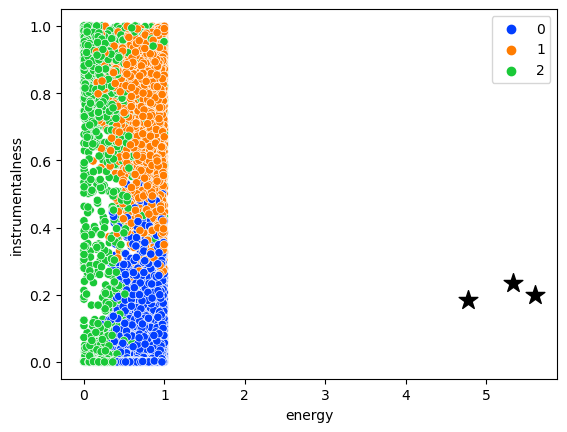

In [48]:
sns.scatterplot(data=df, 
                x="energy", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,4], centers[:,9], c='black', marker='*', s=200)
plt.show()

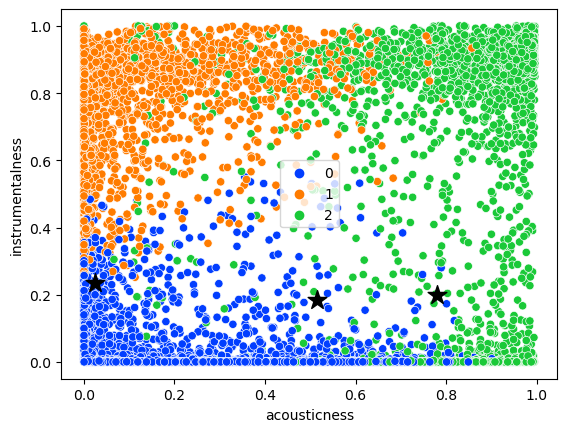

In [49]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,8], centers[:,9], c='black', marker='*', s=200)
plt.show()

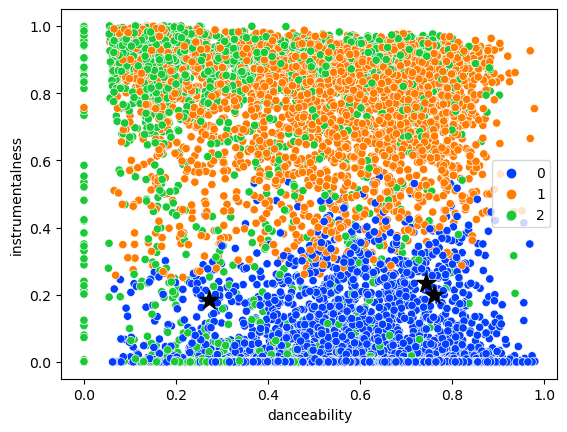

In [50]:
sns.scatterplot(data=df, 
                x="danceability", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,3], centers[:,9], c='black', marker='*', s=200)
plt.show()

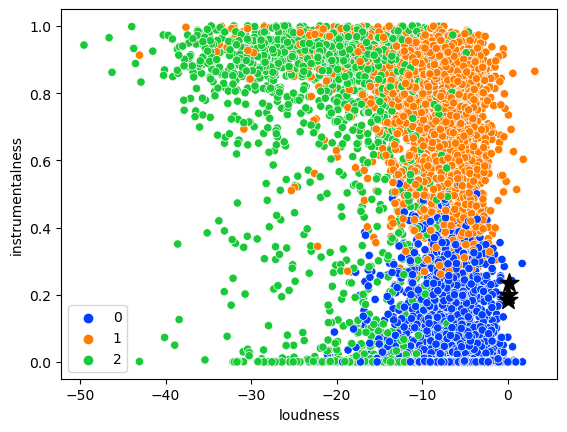

In [51]:
sns.scatterplot(data=df, 
                x="loudness", 
                y="instrumentalness", 
                hue=kmeans.labels_, 
                palette="bright")

plt.scatter(centers[:,6], centers[:,9], c='black', marker='*', s=200)
plt.show()

In [52]:
##### Remember to do the categorization of the continuous variables to check for "y_mapping"

In [53]:
#sns.pairplot(data=df, hue="kmeans.labels_", palette="bright")
#plt.savefig("pairplot k3.png")
#plt.show()

### SSE evaluation

In [54]:
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2]), array([8776, 3327, 2897], dtype=int64))

In [55]:
print('SSE', kmeans.inertia_)
print('Silhouette', silhouette_score(X_minmax, kmeans.labels_))

SSE 6680.913286515601
Silhouette 0.23140264434249977


In [56]:
# how do we select the number of clusters k?

In [57]:
%%time
sse_list = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_minmax)
    sse_list.append(kmeans.inertia_)

CPU times: total: 1.77 s
Wall time: 2.52 s


In [58]:
%%time
sil_list = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_minmax)
    sil_list.append(silhouette_score(X_minmax, kmeans.labels_))

CPU times: total: 15.5 s
Wall time: 20 s


In [59]:
%%time
sil_list = []
dist = squareform(pdist(X_minmax)) # using a precomputed distance matrix

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_minmax)
    sil_list.append(silhouette_score(dist, kmeans.labels_, metric='precomputed'))

CPU times: total: 7.62 s
Wall time: 12.4 s


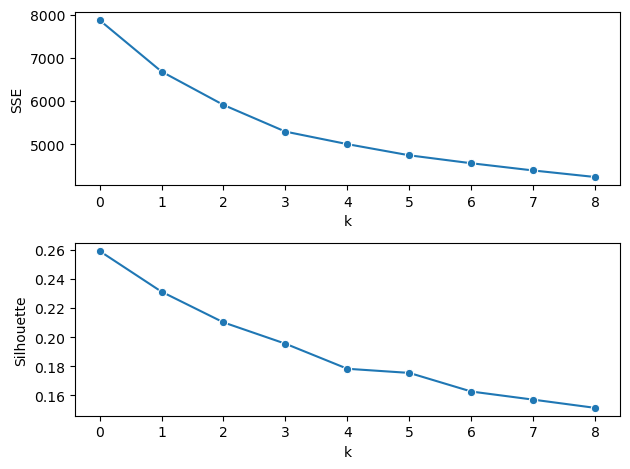

In [60]:
fig, axs = plt.subplots(2) 

sns.lineplot(x=range(len(sse_list)), y=sse_list, marker='o', ax=axs[0])
axs[0].set(xlabel='k', ylabel='SSE')

sns.lineplot(x=range(len(sil_list)), y=sil_list, marker='o', ax=axs[1])
axs[1].set(xlabel='k', ylabel='Silhouette')
#plt.savefig("silhouette.png")
plt.tight_layout() # Adjust the padding between and around subplots

### DBScan

In [61]:
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan.fit(X_minmax)

DBSCAN()

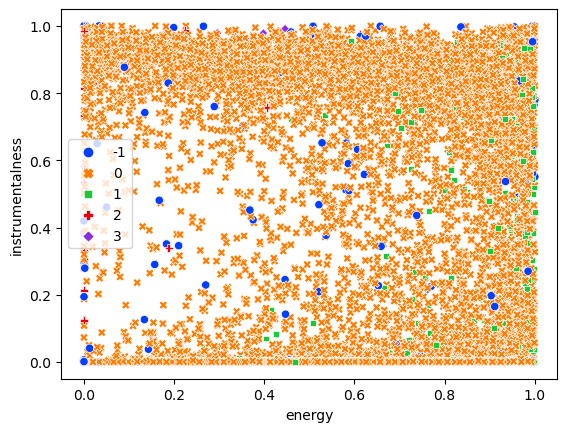

In [26]:
sns.scatterplot(data=df, 
                x="energy", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

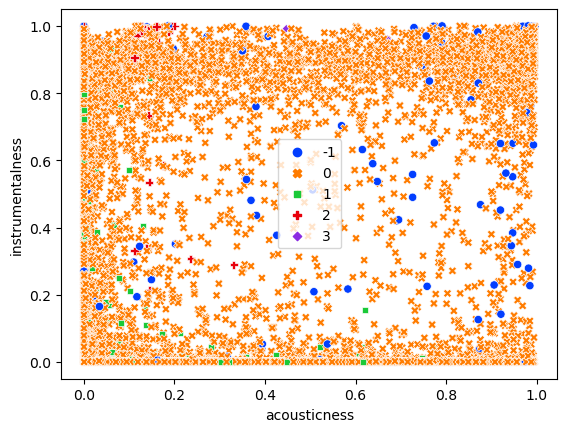

In [27]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

### kth neighbor distance

In [28]:
np.unique(dbscan.labels_, return_counts=True)

(array([-1,  0,  1,  2,  3], dtype=int64),
 array([  160, 13851,   945,    38,     6], dtype=int64))

In [29]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [30]:
print('Silhouette', silhouette_score(X_minmax, dbscan.labels_)) # counting silhouette also w.r.t to noise cluster (-1)
print('Silhouette', silhouette_score(X_minmax[dbscan.labels_ != -1], dbscan.labels_[dbscan.labels_ != -1]))

Silhouette 0.20748612109203973
Silhouette 0.22629953784873094


### kth neighbor distance

In [31]:
dist = pdist(X_minmax, 'euclidean')
dist = squareform(dist)

In [32]:
k=4
kth_distances = []

for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances.append(d[index_kth_distance])  # store the distance in a list

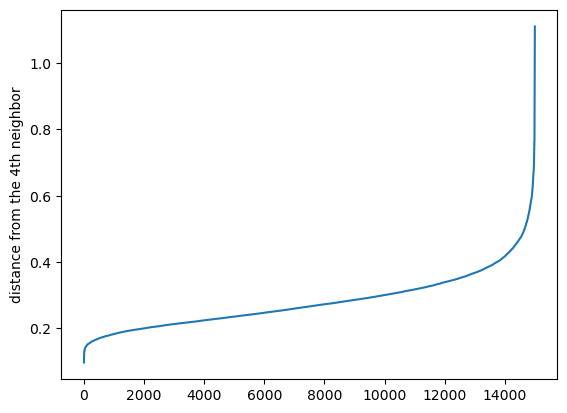

In [33]:
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('distance from the {}th neighbor'.format(k))
         
plt.show()

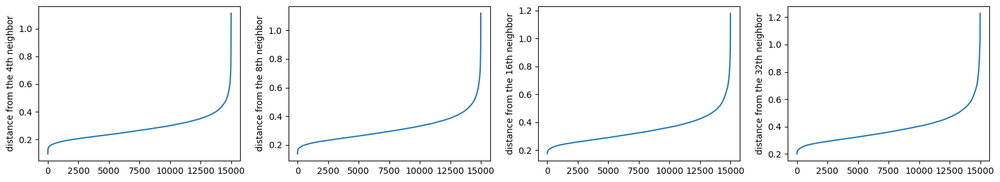

In [34]:
ks = [4, 8, 16, 32]

fig = plt.figure(figsize=(16, 3)) # dimensions of the overall plot
fig_dims = (1, len(ks))

for i in range(len(ks)):
    k = ks[i]
    kth_distances = []

    for d in dist:  # d is a vector containing distances between the ith record and all the others
        index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
        kth_distances.append(d[index_kth_distance])  # store the distance in a list

    plt.subplot2grid(fig_dims, (0, i))
    plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
    plt.ylabel('distance from the {}th neighbor'.format(k))
             
plt.tight_layout()
plt.show()

In [35]:
dbscan = DBSCAN(eps=0.38, min_samples=16, metric='precomputed')
dbscan.fit(dist)

DBSCAN(eps=0.38, metric='precomputed', min_samples=16)

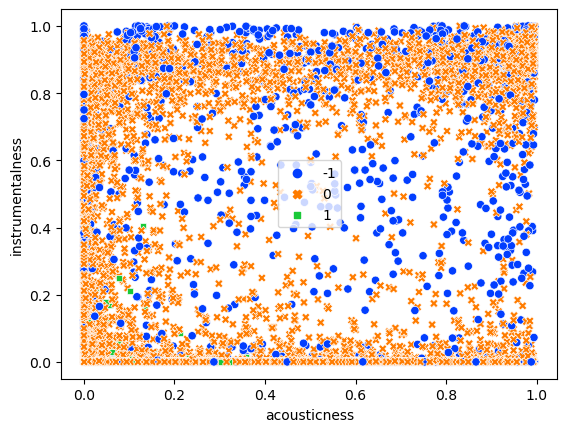

In [36]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

In [37]:
np.unique(dbscan.labels_, return_counts=True)

(array([-1,  0,  1], dtype=int64), array([ 1625, 12837,   538], dtype=int64))

In [38]:
df["dbscan.labels_"] = dbscan.labels_

In [39]:
#sns.pairplot(data=df, hue="dbscan.labels_", palette="bright")
#plt.savefig("pairplot DBSCAN.png")
#plt.show()

### Hierarchical

In [40]:
def get_linkage_matrix(model):
    # Create linkage matrix 
    
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    return linkage_matrix

def plot_dendrogram(model, **kwargs):
    linkage_matrix = get_linkage_matrix(model)
    dendrogram(linkage_matrix, **kwargs)

In [89]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='complete')
model = model.fit(X_minmax)

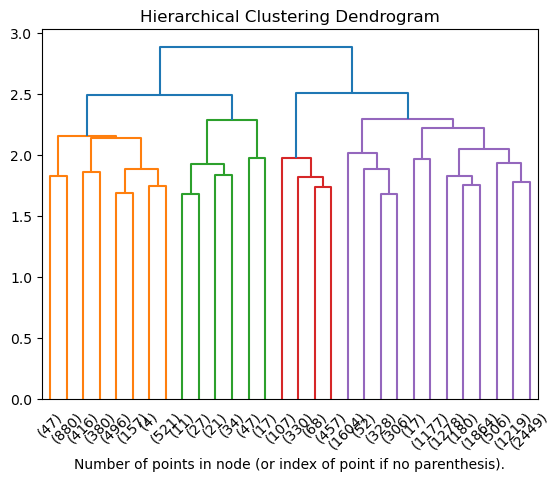

In [95]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode='lastp', color_threshold=2.4)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [96]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=2.4, criterion='distance')

In [97]:
labels

array([4, 4, 1, ..., 4, 4, 4], dtype=int32)

In [98]:
print('Silhouette', silhouette_score(X_minmax, labels))

Silhouette 0.1981414587355598


#### Choosing the number of clusters

In [105]:
hier = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='complete')
hier.fit(X_minmax)

AgglomerativeClustering(linkage='complete', metric='euclidean', n_clusters=4)

In [106]:
hier.labels_

array([0, 0, 3, ..., 0, 0, 0], dtype=int64)

#### Precomputed distance matrix

In [101]:
hier = AgglomerativeClustering(n_clusters=3, metric='precomputed', linkage='complete')
hier.fit(dist)

AgglomerativeClustering(linkage='complete', metric='precomputed', n_clusters=3)

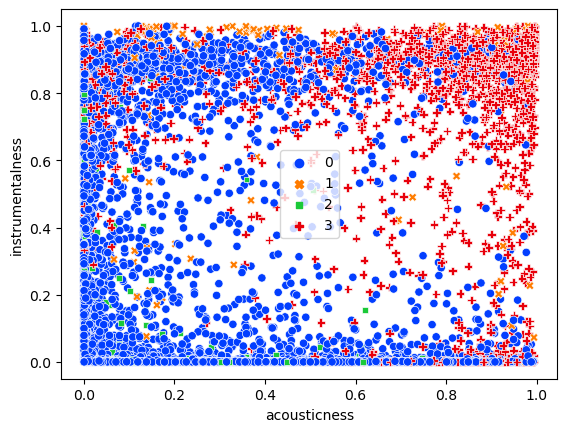

In [107]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

In [108]:
np.unique(hier.labels_, return_counts=True)

(array([0, 1, 2, 3], dtype=int64),
 array([10980,   157,   962,  2901], dtype=int64))

C:\Users\javie\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


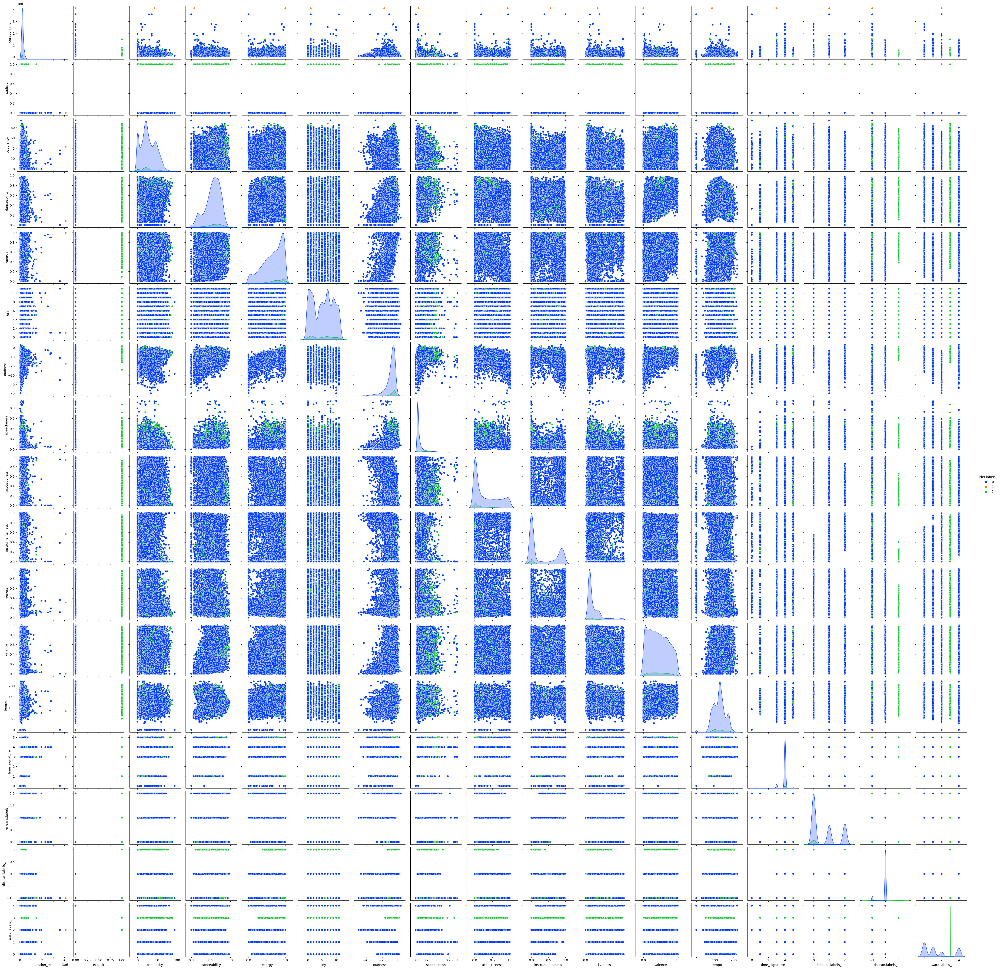

In [110]:
sns.pairplot(data=df, hue="hier.labels_", palette="bright")
plt.savefig("pairplot Hier complete k4.png")
plt.show()

### Ward hierarchical

In [51]:
# hierarchical clustering
# Compute the (weighted) graph of k-Neighbors for points in X
connectivity = kneighbors_graph(X_minmax, n_neighbors=100, include_self=False)

In [72]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, 
                                n_clusters=None, 
                                metric='euclidean', 
                                linkage='ward', 
                                connectivity=connectivity)
                                
# connecet: Defines for each sample the neighboring 
# samples following a given structure of the data.

model = model.fit(X_minmax)

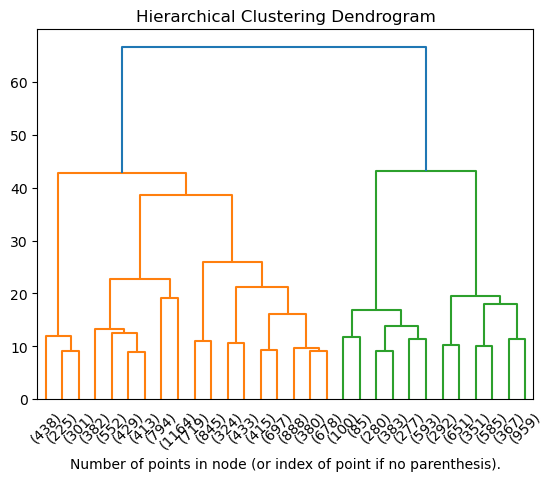

In [73]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [78]:
ward = AgglomerativeClustering(n_clusters=3, 
                               linkage='ward', 
                               metric='euclidean',
                               connectivity=connectivity)
ward.fit(X_minmax)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_minmax, ward.labels_))

labels {0: 10077, 1: 3205, 2: 1718}
silhouette 0.1944572237497397


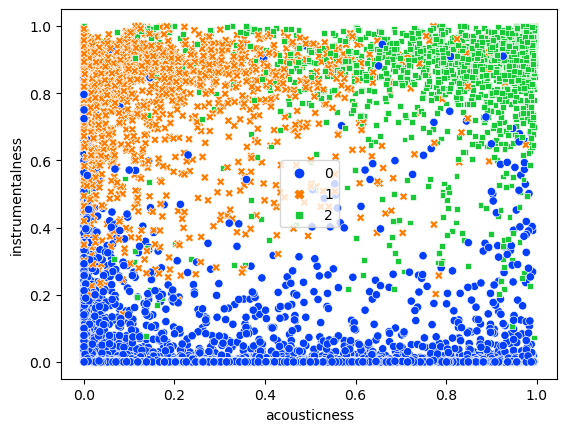

In [79]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=ward.labels_, 
                style=ward.labels_, 
                palette="bright")
plt.show()

In [77]:
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=43, criterion='distance')

In [56]:
df["ward.labels_"] = ward.labels_

In [57]:
#sns.pairplot(data=df, hue="ward.labels_", palette="bright")
#plt.savefig("pairplot Hier Ward.png")
#plt.show()

In [58]:
print('average linkage')
average_linkage = AgglomerativeClustering(n_clusters=3, linkage='average', metric='manhattan',  connectivity=connectivity)
average_linkage.fit(X_minmax)

hist, bins = np.histogram(average_linkage.labels_, 
                          bins=range(0, len(set(average_linkage.labels_)) + 1))

print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_minmax, average_linkage.labels_))

average linkage
labels {0: 14998, 1: 1, 2: 1}
silhouette 0.19765043631364287


In [59]:
print('complete linkage')
complete_linkage = AgglomerativeClustering(n_clusters=3, linkage='complete', metric='l1', connectivity=connectivity)
complete_linkage.fit(X_minmax)

hist, bins = np.histogram(complete_linkage.labels_, 
                          bins=range(0, len(set(complete_linkage.labels_)) + 1))

print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_minmax, complete_linkage.labels_))

complete linkage
labels {0: 2574, 1: 91, 2: 12335}
silhouette -0.009361211048084862


#### Linkage = 'single'

In [60]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='single')
model = model.fit(X_minmax)

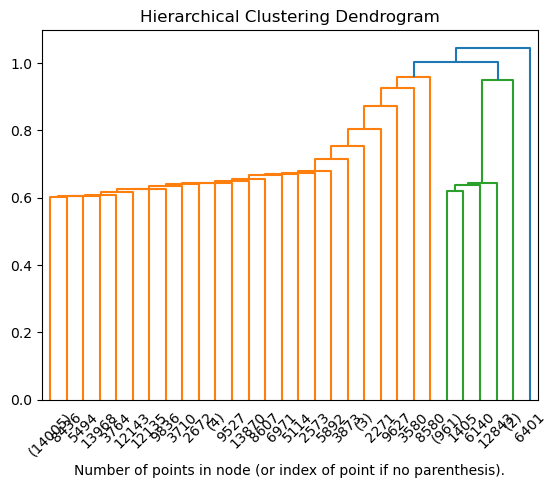

In [61]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode='lastp', color_threshold=1)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [62]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=1, criterion='distance')

In [63]:
labels

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [64]:
print('Silhouette', silhouette_score(X_minmax, labels))

Silhouette 0.22639298391028664


#### Choosing the number of clusters

In [65]:
hier = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='single')
hier.fit(X_minmax)

AgglomerativeClustering(linkage='single', metric='euclidean', n_clusters=3)

In [66]:
hier.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

#### Precomputed distance matrix

In [67]:
hier = AgglomerativeClustering(n_clusters=3, metric='precomputed', linkage='single')
hier.fit(dist)

AgglomerativeClustering(linkage='single', metric='precomputed', n_clusters=3)

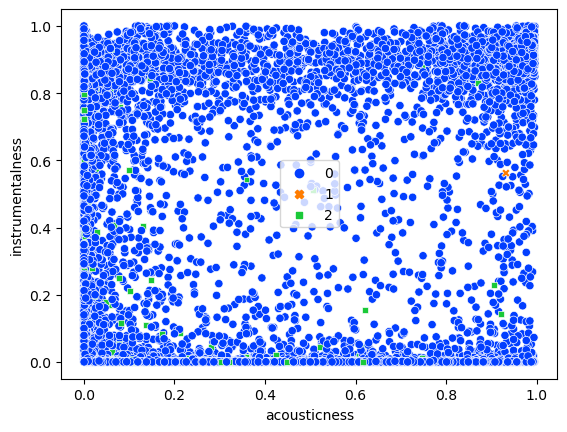

In [68]:
sns.scatterplot(data=df, 
                x="acousticness", 
                y="instrumentalness", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

In [69]:
df["hier.labels_"] = hier.labels_

In [70]:
#sns.pairplot(data=df, hue="hier.labels_", palette="bright")
#plt.savefig("pairplot Hier single.png")
#plt.show()